In [1]:
%matplotlib inline
!python -V

Python 3.7.6


In [2]:
# import necessary Python packages
import os
import numpy as np
import urllib.request

# print message after packages imported successfully
print("import of packages successful")
os.getcwd()
os.chdir("E:/nvtng/Projects/GitHub/umap-explorer/data/")


import of packages successful


In [3]:
# data relate to time radar
# data = np.loadtxt(fname = "hpcc.csv",delimiter=',')
# f = open('hpcc_color.txt', 'r')
# data of full dataset
data = np.loadtxt(fname = "hpcc_full_26_4_2019.csv",delimiter=',')
f = open('hpcc_color_full_26_4_2019.txt', 'r')
print(data)
data_color = f.read().splitlines()
f.close()

[[0.56842105 0.43157895 0.17894737 ... 0.525      0.53333333 0.4515625 ]
 [0.56842105 0.43157895 0.16842105 ... 0.5375     0.5375     0.434375  ]
 [0.57894737 0.45263158 0.17894737 ... 0.5125     0.52083333 0.4546875 ]
 ...
 [0.65263158 0.49473684 0.11578947 ... 0.5375     0.5375     0.4546875 ]
 [0.65263158 0.49473684 0.11578947 ... 0.5375     0.5375     0.4515625 ]
 [0.65263158 0.49473684 0.12631579 ... 0.5375     0.5375     0.4546875 ]]



UMAP on the HPCC dataset
--------------------------------




In [4]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import umap
import numba
import warnings

with warnings.catch_warnings():
    warnings.simplefilter('ignore', numba.errors.NumbaDeprecationWarning)

    
%matplotlib inline
sns.set(style='white', rc={'figure.figsize':(12,8)})

In [5]:
# np.random.seed(42)
# data = np.random.rand(800, 9)
print(data[0,:])

[0.56842105 0.43157895 0.17894737 0.05152932 0.525      0.525
 0.525      0.53333333 0.4515625 ]


In [6]:
fit = umap.UMAP()
%time u = fit.fit_transform(data)

E:\nvtng\Documents\anaconda2\lib\site-packages\umap\rp_tree.py:450: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "make_euclidean_tree" failed type inference due to: Invalid use of recursive(type(CPUDispatcher(<function make_euclidean_tree at 0x000001F0070B5DC8>))) with parameters (array(float32, 2d, C), array(int64, 1d, C), array(int64, 1d, C), int64)
No type info available for recursive(type(CPUDispatcher(<function make_euclidean_tree at 0x000001F0070B5DC8>))) as a callable.
[1] During: resolving callee type: recursive(type(CPUDispatcher(<function make_euclidean_tree at 0x000001F0070B5DC8>)))
[2] During: typing of call at E:\nvtng\Documents\anaconda2\lib\site-packages\umap\rp_tree.py (457)


File "..\..\..\..\Documents\anaconda2\lib\site-packages\umap\rp_tree.py", line 457:
def make_euclidean_tree(data, indices, rng_state, leaf_size=30):
    <source elided>

        left_node = make_euclidean_tree(data, left_indices, rng_state, le

Wall time: 37.2 s


[[12.604999    0.691077  ]
 [12.6144905   0.7090129 ]
 [12.593663    0.69434595]
 ...
 [11.747317   -0.6952309 ]
 [11.751755   -0.68338966]
 [11.735546   -0.68748105]]


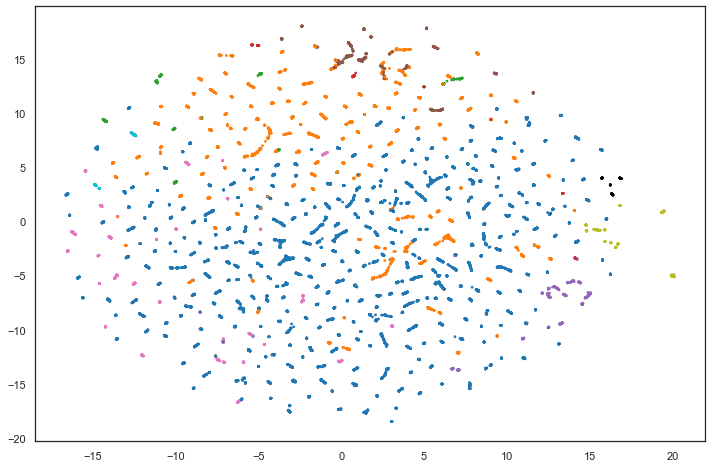

In [7]:
print(u)
# plt.scatter(u[:,0], u[:,1], c=data)
plt.scatter(u[:,0], u[:,1], c=data_color,s=3)

In [8]:
def draw_umap(n_neighbors=21, min_dist=0.3, n_components=2, metric='euclidean', title=''):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    u = fit.fit_transform(data);
    fig = plt.figure()
    if n_components == 1:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], range(len(u)), c=data_color,s=3)
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], u[:,1], c=data_color,s=3)
    if n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(u[:,0], u[:,1], u[:,2], c=data_color,s=3)
    plt.title(title, fontsize=18)

E:\nvtng\Documents\anaconda2\lib\site-packages\numba\typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\Documents\anaconda2\lib\site-packages\umap\nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))
E:\nvtng\Documents\anaconda2\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 5805 separate connected components using meta-embedding (experimental)
  n_components
E:\nvtng\Documents\anaconda2\lib\site-packages\umap\spectral.py:182: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  "W

E:\nvtng\Documents\anaconda2\lib\site-packages\numba\typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\Documents\anaconda2\lib\site-packages\umap\nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))
E:\nvtng\Documents\anaconda2\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 5755 separate connected components using meta-embedding (experimental)
  n_components
E:\nvtng\Documents\anaconda2\lib\site-packages\umap\spectral.py:182: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  "W

E:\nvtng\Documents\anaconda2\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 651 separate connected components using meta-embedding (experimental)
  n_components
E:\nvtng\Documents\anaconda2\lib\site-packages\umap\spectral.py:182: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  "WARNING: spectral initialisation failed! The eigenvector solver\n"
E:\nvtng\Documents\anaconda2\lib\site-packages\numba\typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\Documents\anaconda2\lib\site-packages\umap\nndescent.py", line 47:
    @numba.njit

E:\nvtng\Documents\anaconda2\lib\site-packages\numba\typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\Documents\anaconda2\lib\site-packages\umap\nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))
E:\nvtng\Documents\anaconda2\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 279 separate connected components using meta-embedding (experimental)
  n_components
E:\nvtng\Documents\anaconda2\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning

E:\nvtng\Documents\anaconda2\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 270 separate connected components using meta-embedding (experimental)
  n_components
E:\nvtng\Documents\anaconda2\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':
E:\nvtng\Documents\anaconda2\lib\site-packages\numba\typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\Documents\anaconda2\lib\site-packages\umap\nndescent.py", line 47:
    @

E:\nvtng\Documents\anaconda2\lib\site-packages\numba\typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\Documents\anaconda2\lib\site-packages\umap\nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))
E:\nvtng\Documents\anaconda2\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 137 separate connected components using meta-embedding (experimental)
  n_components
E:\nvtng\Documents\anaconda2\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning

E:\nvtng\Documents\anaconda2\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 57 separate connected components using meta-embedding (experimental)
  n_components
E:\nvtng\Documents\anaconda2\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':
E:\nvtng\Documents\anaconda2\lib\site-packages\numba\typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\Documents\anaconda2\lib\site-packages\umap\nndescent.py", line 47:
    @n

E:\nvtng\Documents\anaconda2\lib\site-packages\numba\typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\Documents\anaconda2\lib\site-packages\umap\nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))
E:\nvtng\Documents\anaconda2\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 35 separate connected components using meta-embedding (experimental)
  n_components
E:\nvtng\Documents\anaconda2\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning,

E:\nvtng\Documents\anaconda2\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 36 separate connected components using meta-embedding (experimental)
  n_components
E:\nvtng\Documents\anaconda2\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':
E:\nvtng\Documents\anaconda2\lib\site-packages\numba\typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\Documents\anaconda2\lib\site-packages\umap\nndescent.py", line 47:
    @n

E:\nvtng\Documents\anaconda2\lib\site-packages\numba\typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\Documents\anaconda2\lib\site-packages\umap\nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))
E:\nvtng\Documents\anaconda2\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 22 separate connected components using meta-embedding (experimental)
  n_components
E:\nvtng\Documents\anaconda2\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning,

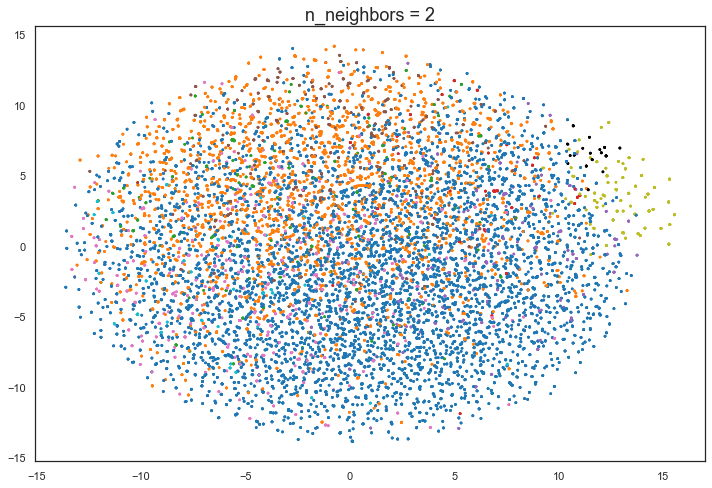

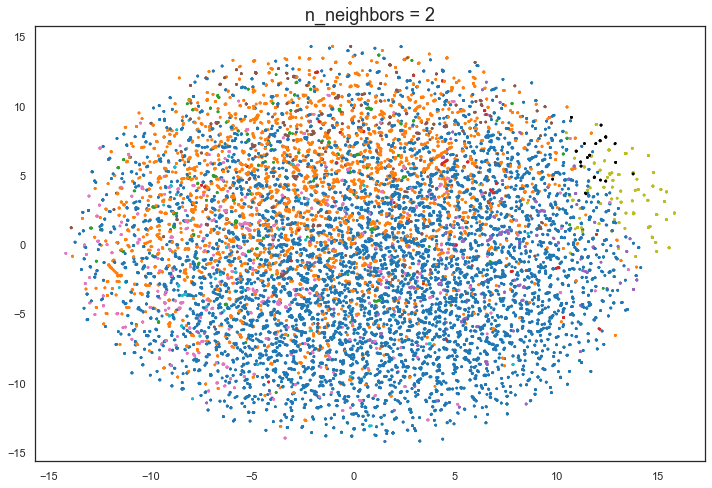

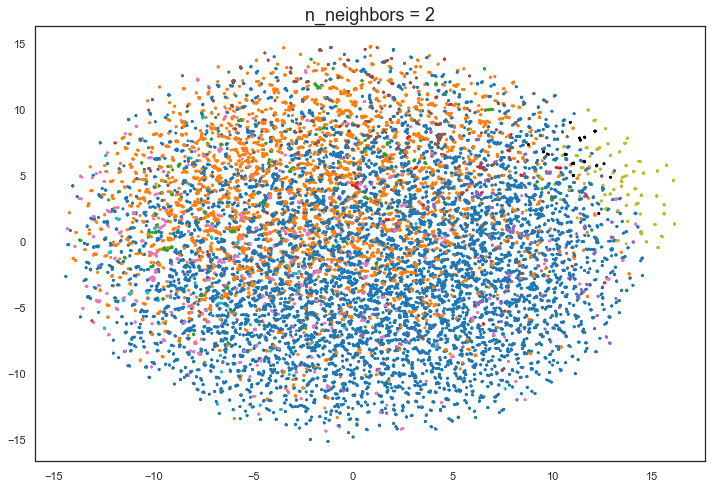

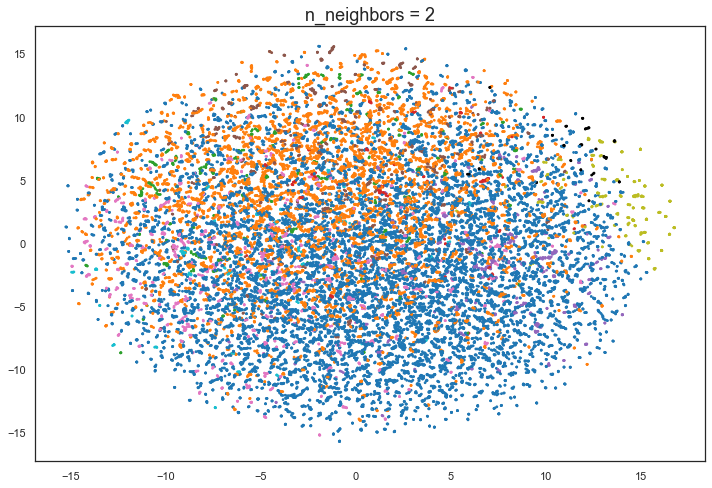

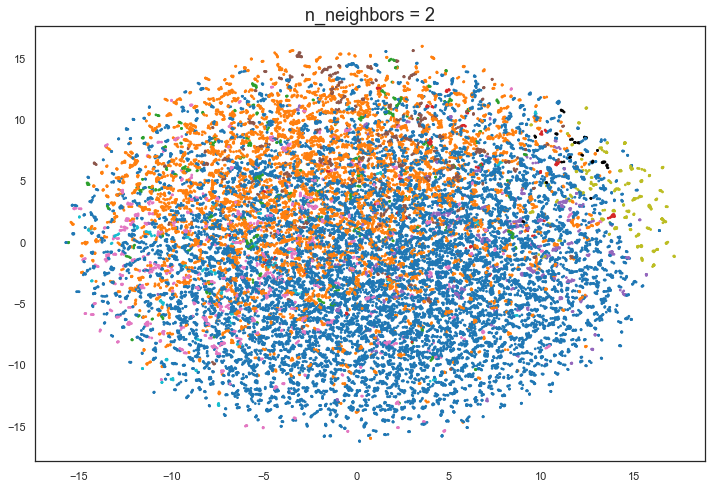

...

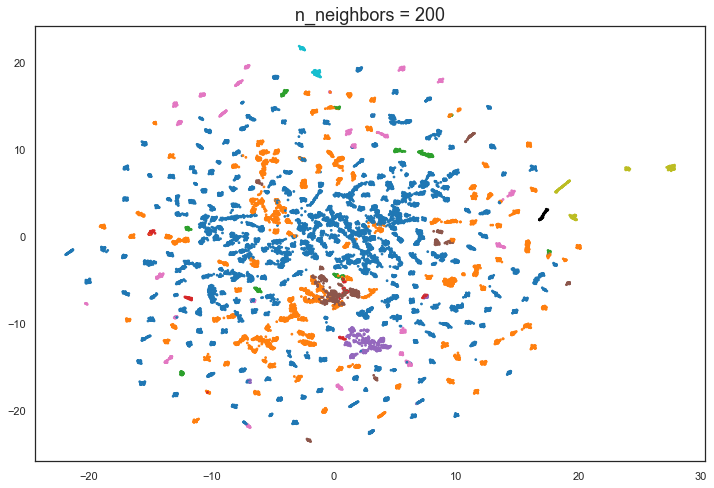

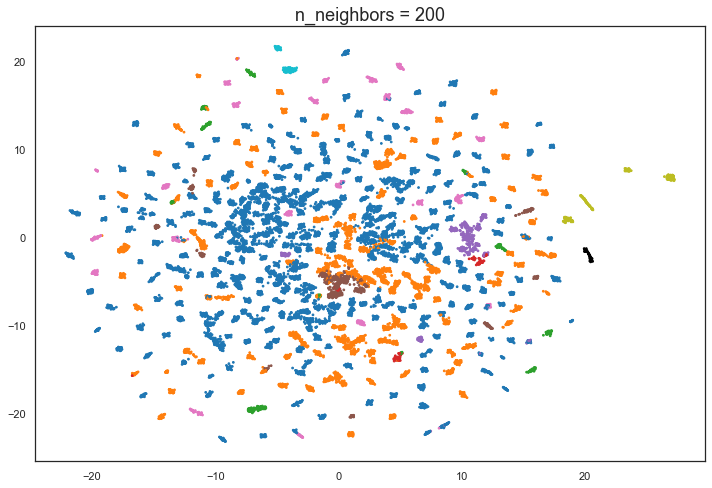

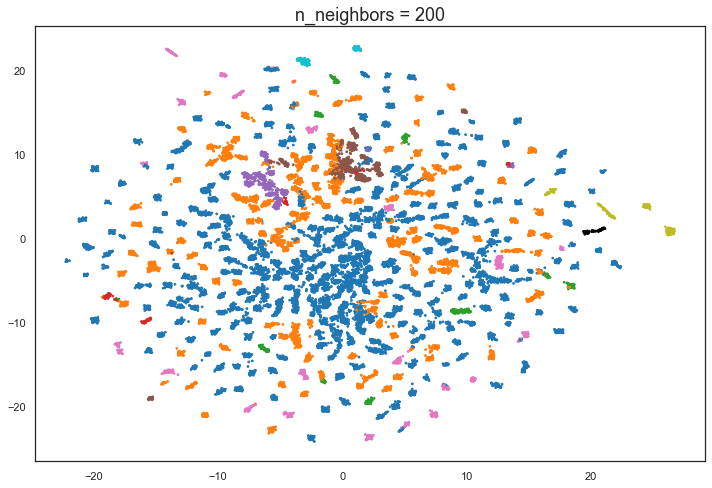

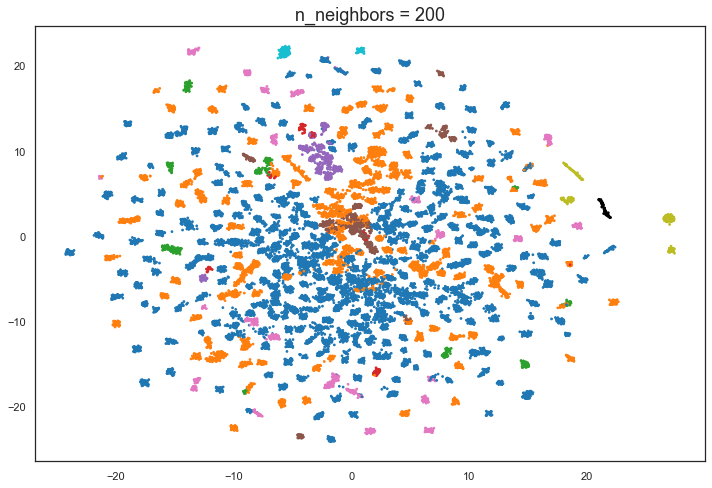

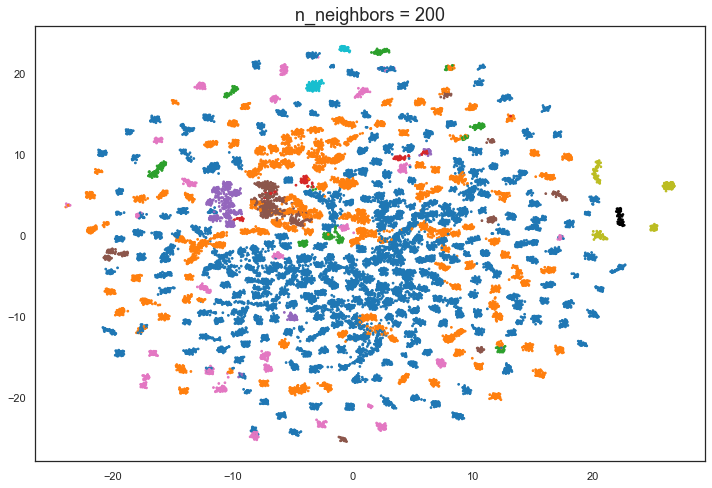

In [9]:
for n in (2, 5, 10, 20, 50, 100, 200):
    for m in (0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1):
        draw_umap(n_neighbors=n,min_dist=m, title='n_neighbors = {}'.format(n))